<a href="https://colab.research.google.com/github/tinypapercrane/LossLeaders/blob/main/LossLeaders.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# this mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# enter the foldername in your Drive where you have saved the unzipped
# workshop folder, e.g. 'acmlab/workshops/week3'
FOLDERNAME = 'acmlab/onboarding/project'
assert FOLDERNAME is not None, "[!] Enter the foldername."

# now that we've mounted your Drive, this ensures that
# the Python interpreter of the Colab VM can load
# python files from within it.
import sys
sys.path.append('/content/fdrive/My Drive/{}'.format(FOLDERNAME))

%cd /content/drive/My Drive/$FOLDERNAME/

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1WrwrohKfnFK1LjTVdrWcWYkegAHiKBsB/onboarding/project


In [ ]:
# Importing the standard ML libraries...
%load_ext autoreload
%autoreload 2

import pandas as pd                     # to process our data
import matplotlib.pyplot as plt         # graphing
import numpy as np                      # matrices

import math
import webmercator as wmc
import util
import torch
import torchvision                      # for MNIST dataset/working with images
from torch.utils.data import DataLoader, Dataset
from PIL import Image                   # for loading Images into numpy
from sklearn.model_selection import train_test_split
import torchvision.transforms as transforms

import torch
from torch.utils.tensorboard import SummaryWriter

import datetime
import pytz

# take advantage of GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
#CAN SKIP THIS STEP NOW BECAUSE ZIPS ARE NOW STORED IN ZIPS.NPY
#Get and process csv files
xyzips = np.zeros((45, 44))

house_data = pd.read_csv('16zpallnoagi.csv')
house_data = house_data[["ZIPCODE","N1","A02650"]]
zip_data = pd.read_csv('ziplatlon.csv', sep = ';')
zip_data = zip_data[['zip', 'latitude', 'longitude']]
zip_data = zip_data[(zip_data['longitude'] <= -117.6) &(zip_data['longitude'] >= -118.6) & (zip_data['latitude'] >= 33.5) &(zip_data['latitude'] <= 34.3)]

#take out zip codes that dont have entries in 16zpallnoagi
new_zips = pd.DataFrame(columns=['zip','latitude','longitude'])
for i in range(len(zip_data)):
  if(zip_data.iat[i, 0] in house_data["ZIPCODE"].values):
    new_zips = new_zips.append(zip_data.iloc[i], ignore_index=True)
zip_data = new_zips

In [ ]:
#CAN SKIP THIS STEP NOW BECAUSE ZIPS ARE NOW STORED IN ZIPS.NPY
#for each z assign z to tile that contains center of z
for i in range(len(zip_data)):
  x, y = wmc.xy(zip_data.iat[i, 1], zip_data.iat[i, 2], 14)
  x = math.floor(x)
  y = math.floor(y)
  if(x < 2839) and (y < 6572):
    xyzips[x-2794][y-6528] = zip_data.iat[i, 0]

dist = lambda x1, y1, x2, y2 : math.sqrt((x2-x1)*(x2-x1) + (y2-y1)*(y2-y1))

#assign closest zip code to t
for xFake in range(45):
  for yFake in range(44):
    if (util.getElevation(wmc.lat(yFake+6528, 14), wmc.lon(xFake+2794, 14))!=0) and (xyzips[xFake][yFake] == 0):
      xZip, yZip = wmc.xy(zip_data.iat[0, 1], zip_data.iat[0, 2], 14)
      min = dist(xFake + 0.5 + 2794, yFake+ 0.5 + 6528, xZip, yZip)
      zip = zip_data.iat[0, 0]
      index = 0
      for i in range(len(zip_data)):
          xZip, yZip = wmc.xy(zip_data.iat[i, 1], zip_data.iat[i, 2], 14)
          distance = dist(xFake + 0.5 + 2794, yFake+ 0.5 + 6528, xZip, yZip)
          if(distance < min):
            min = distance
            zip = zip_data.iat[i, 0]
            index = i;
      xyzips[xFake][yFake] = zip



In [ ]:
#CAN SKIP THIS STEP NOW BECAUSE ZIPS ARE NOW STORED IN ZIPS.NPY
np.save("zips.npy", xyzips)

In [ ]:
#CAN SKIP THIS STEP NOW BECAUSE ZIPS ARE NOW STORED IN ZIPS.NPY
xyzips = np.load("zips.npy")

In [ ]:
#CAN SKIP THIS STEP NOW BECAUSE THIS IS DISPLAYS THE ZIPCODES
xyzips.shape
for yFake in range(44):
  print("")
  for xFake in range(45):
    zip =xyzips[xFake][yFake]
    color = int((zip % 8)+40)
    string = ""
    if(zip == 0):
      string = "0000"
    print(f"\033[2;31;{color}m {zip}{string} \033[0;0m", end='')


 91311.0  91326.0  91326.0  91326.0  91344.0  91344.0  91340.0  91340.0  91340.0  91340.0  91340.0  91040.0  91040.0  91040.0  91042.0  91042.0  91042.0  91042.0  91214.0  91214.0  91011.0  91011.0  91001.0  91001.0  91001.0  91001.0  91024.0  91024.0  91024.0  91024.0  91010.0  91741.0  91741.0  91741.0  91741.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0 
 91311.0  91326.0  91326.0  91326.0  91344.0  91344.0  91345.0  91340.0  91340.0  91331.0  91331.0  91040.0  91040.0  91040.0  91042.0  91042.0  91042.0  91214.0  91214.0  91011.0  91011.0  91011.0  91001.0  91001.0  91001.0  91024.0  91024.0  91024.0  91024.0  91024.0  91010.0  91010.0  91741.0  91741.0  91741.0  91741.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0  91759.0 
 91311.0  91311.0  91326.0  91326.0  91344.0  91344.0  91345.0  91345.0  91331.0  91331.0  91352.0  91040.0  91040.0  91040.0  91042.0  91042.0  91214.0  91214.0  91214.0  91011.0  91011.

In [ ]:
#CAN SKIP THIS STEP SINCE THIS DATA IS STORED IN avIncome.py
#code for geting the income values for each image tile
#to get into the correct 1980 formate i think we can just use torch.view(1980) or something
# also we can do the same thing for xyzips
xymonies = np.zeros((45, 44))

for x in range(45):
  for y in range(44):
    if int(xyzips[x][y]) != 0:
      pop = (int)(house_data[house_data["ZIPCODE"] == int(xyzips[x][y])]["N1"].values)
      totalmonies = (int)(house_data[house_data["ZIPCODE"] == int(xyzips[x][y])]["A02650"].values)
      xymonies[x][y] = totalmonies/pop
    else:
      xymonies[x][y] = 0
xymonies = np.reshape(xymonies, 1980)

In [ ]:
#CAN SKIP THIS STEP SINCE THIS DATA IS STORED IN avIncome.py
np.save("avIncome.npy", xymonies)

In [ ]:
average_income = np.load("avIncome.npy")
average_income = np.reshape(average_income, 1980)

In [ ]:
#CAN SKIP THIS STEP SINCE IT DISPLAYS AVERAGE INCOMES.
income_display = average_income
income_display = np.reshape(income_display, (45, 44))
for yFake in range(44):
  print("")
  for xFake in range(45):
    zip = math.floor(income_display[xFake][yFake])
    color = int((zip % 8)+40)
    string = "0"
    if(int(zip / 100) >= 1):
      string = ""
    if(zip == 0):
      string = "00"
    print(f"\033[2;31;{color}m {string}{zip} \033[0;0m", end='')


 091  109  109  109  075  075  038  038  038  038  038  072  072  072  059  059  059  059  097  097  289  289  099  099  099  099  125  125  125  125  057  106  106  106  106  075  075  075  075  075  075  075  075  075  075 
 091  109  109  109  075  075  047  038  038  035  035  072  072  072  059  059  059  097  097  289  289  289  099  099  099  125  125  125  125  125  057  057  106  106  106  106  075  075  075  075  075  075  075  075  075 
 091  091  109  109  075  075  047  047  035  035  045  072  072  072  059  059  097  097  097  289  289  099  099  099  099  125  125  125  125  125  057  057  106  106  106  106  075  075  075  075  075  075  075  075  075 
 091  071  071  069  069  049  049  035  035  035  045  045  072  072  059  059  097  097  289  289  289  099  099  099  099  125  125  125  125  057  057  057  106  106  106  106  106  075  075  075  075  075  075  075  075 
 048  048  071  069  069  049  034  034  034  038  045  045  078  078  059  097  097  067  289 

In [ ]:
import random

imageSize = 256
transformsPerImage = 3
appliers = []

def addToAppliers(transform):
  appliers.append(transforms.Compose([transform, transforms.Resize(imageSize)]))

for size in (100, 150, 200, imageSize):
  addToAppliers(transforms.CenterCrop(size=size))
addToAppliers(transforms.RandomRotation(degrees=(0, 180), expand=True))
addToAppliers(transforms.RandomAffine(degrees=(30, 70), translate=(0.1, 0.2), scale=(0.8, 0.95)))
addToAppliers(transforms.RandomCrop(size=(128, 128)))
addToAppliers(transforms.RandomPosterize(bits=3))
addToAppliers(transforms.RandomAdjustSharpness(sharpness_factor=2))
addToAppliers(transforms.RandomAutocontrast())
addToAppliers(transforms.RandomHorizontalFlip(p=0.5))
addToAppliers(transforms.RandomVerticalFlip(p=0.5))

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, root_dir, labels, incomes, shouldAugment):
        self.indexes = labels
        self.root_dir = root_dir
        self.incomes = incomes
        self.shouldAugment = shouldAugment

    def __len__(self):
        return len(self.indexes)

    def __getitem__(self, iteridx):
        idx = int(self.indexes[iteridx])
        if torch.is_tensor(idx):
            idx = idx.tolist()
        x = math.floor(idx / 44) + 2794
        y = (idx % 44) + 6528
        # if self.transforms:
        #   img = Image.open(f"{self.root_dir}/14_{x}_{y}.jpg").convert("RGB")
        #   img = np.asarray(img).astype(np.uint8)
        #   image = self.transforms(img)
        # else:
        #   image = torch.from_numpy(np.asarray(Image.open(f"{self.root_dir}/14_{x}_{y}.jpg").convert("RGB"), dtype="uint8"))
        #   image = torch.transpose(image, 0, 2)
        pilImage = Image.open(f"{self.root_dir}/14_{x}_{y}.jpg")
        augmentations = random.sample(appliers, random.randint(1, 3)) if self.shouldAugment else []
        transform = transforms.Compose(augmentations + [transforms.ToTensor()])
        image = transform(pilImage)
        income = self.incomes[idx]
        income = np.array([income])
        income = income.astype('float').reshape(1)
        sample = (image, income)

        return sample

In [ ]:
indexes = np.zeros(1980)
for i in range(1980):
  indexes[i] = i;

indexes = indexes[average_income != 0]
print(indexes.shape)


(1460,)


In [ ]:
batch_size_train = 50
batch_size_test = 20

train_size = 1200
raw_train_y, test_y = train_test_split(indexes, train_size=train_size, random_state=925)

train_y = np.zeros(train_size * transformsPerImage)
for i in range(train_size):
  for j in range(transformsPerImage):
    train_y[i * transformsPerImage + j] = raw_train_y[i]

print("Raw train images used (excluding augmented):", train_y.shape[0] // transformsPerImage)
print("Train images used (including augmented):", train_y.shape[0])
print("Test images used (none augmented):", test_y.shape[0])

train_dataset = ImageDataset("imagery", train_y, average_income, True)
test_dataset = ImageDataset("imagery", test_y, average_income, False)

train_dl = torch.utils.data.DataLoader(train_dataset, batch_size_train, shuffle=True)
test_dl = torch.utils.data.DataLoader(test_dataset, batch_size_test, shuffle=False)

Raw train images used (excluding augmented): 1200
Train images used (including augmented): 3600
Test images used (none augmented): 260


In [ ]:
#CAN SKIP THIS STEP SINCE IT CHECKS WHETHER OR NOT THE CURRENT SHAPE OF TEST IMAGES AND LABELS IS WHAT WE THINK IT IS.
dataiter = iter(test_dl)
images, labels = dataiter.next()
print(images.shape)
print(labels.shape)

torch.Size([20, 3, 256, 256])
torch.Size([20, 1])


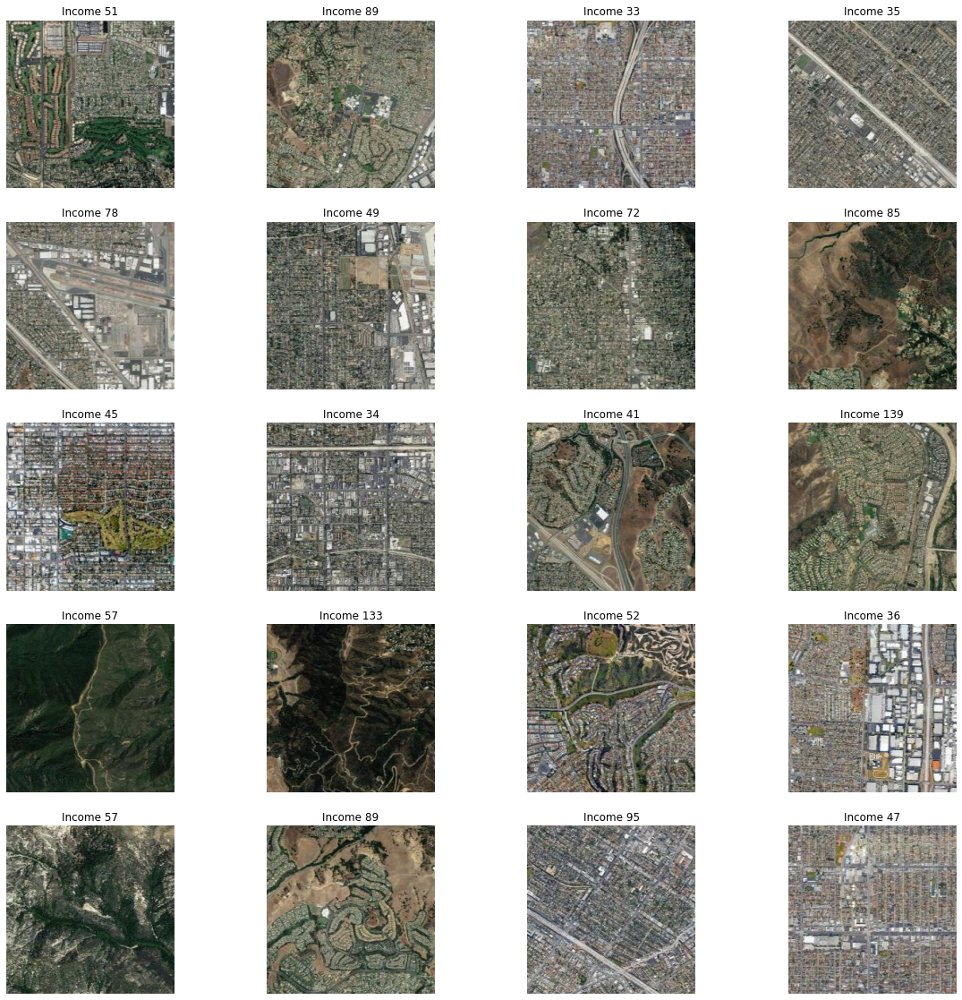

In [ ]:
#CAN SKIP THIS STEP SINCE IT DISPLAYS SOME TEST IMAGES.
figure = plt.figure(figsize=(20, 20))
num_rows = 5
num_cols = 4
for idx in range(batch_size_test):
  plt.subplot(num_rows, num_cols, idx + 1) # subplot indices begin at 1, not 0
  plt.axis('off')
  plt.title(f"Income {int(labels[idx])}")
  plt.imshow(torch.transpose(images[idx], 0, 2).squeeze())

In [ ]:
#CAN SKIP THIS STEP SINCE IT CHECKS WHETHER OR NOT THE CURRENT SHAPE OF TRAIN IMAGES AND LABELS IS WHAT WE THINK IT IS.
dataiter = iter(train_dl)
images, labels = dataiter.next()
print(images.shape)
print(labels.shape)

torch.Size([5, 3, 256, 256])
torch.Size([5, 1])


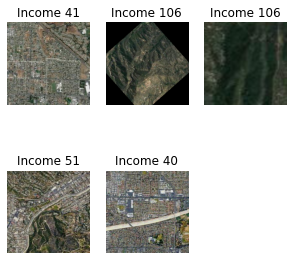

In [ ]:
#CAN SKIP THIS STEP SINCE IT DISPLAYS SOME TRAIN IMAGES.
figure = plt.figure(figsize=(5, 5))
num_rows = 2
num_cols = 3
for idx in range(batch_size_train):
  plt.subplot(num_rows, num_cols, idx + 1) # subplot indices begin at 1, not 0
  plt.axis('off')
  plt.title(f"Income {int(labels[idx])}")
  plt.imshow(torch.transpose(images[idx], 0, 2).squeeze())

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class ConvolutionalNeuralNet(nn.Module):
  def __init__(self):
    super(ConvolutionalNeuralNet, self).__init__()
    self.conv1 = nn.Conv2d(3, 100, 5)
    self.conv2 = nn.Conv2d(100, 50, 5)
    self.conv3 = nn.Conv2d(50, 40, 5)
    self.conv4 = nn.Conv2d(40, 15, 5)
    self.conv5 = nn.Conv2d(15, 7, 4)

    self.pool = nn.MaxPool2d(2, 2)
    self.pool1 = nn.MaxPool2d(3, 3)
    self.batchnorm1 = torch.nn.BatchNorm2d(num_features= 100)
    self.batchnorm2 = torch.nn.BatchNorm2d(num_features= 50)
    self.batchnorm3 = torch.nn.BatchNorm2d(num_features= 40)
    self.batchnorm4 = torch.nn.BatchNorm2d(num_features= 15)
    self.batchnorm5 = torch.nn.BatchNorm2d(num_features= 7)


    self.dropout = torch.nn.Dropout(p=0.2)
    self.fc1 = nn.Linear(7 * 2 * 2, 50)
    self.fc2 = nn.Linear(50, 10)
    self.fc3 = nn.Linear(10, 1)

  def forward(self, x):
    x = self.pool1(F.relu(self.conv1(x)))
    x = self.dropout(x)
    x = self.batchnorm1(x)
    x = self.pool(F.relu(self.conv2(x)))
    x = self.dropout(x)
    x = self.batchnorm2(x)
    x = self.pool(F.relu(self.conv3(x)))
    x = self.dropout(x)
    x = self.batchnorm3(x)
    x = self.pool(F.relu(self.conv4(x)))
    x = self.dropout(x)
    x = self.batchnorm4(x)
    x = self.pool(F.relu(self.conv5(x)))
    x = self.dropout(x)
    x = self.batchnorm5(x)
    x = x.view(-1, 7 * 2 * 2)
    x = self.fc1(x)
    x = self.fc2(x)
    x = self.fc3(x)
    return x
  
  def predict(self, imgPath):
    apply = transforms.Compose([transforms.ToTensor()])
    image = apply(Image.open(f"{imgPath}"))
    return float(self(image[None, ...].to(device=device)))

In [ ]:
def train_loop(dataloader, model, loss_fn, optimizer, writer=None, epoch=0):
    print(f"\033[1m-----------Epoch {epoch}------------\033[0m")
    size = len(dataloader.dataset)
    epoch_loss = 0
    model.train()
    for batch, (x, y) in enumerate(dataloader):
        x = x.to(dtype=torch.float, device=device)
        y = y.to(dtype=torch.float, device=device)
        pred = model(x)
        loss = loss_fn(pred, y) #torch.clamp(y, 0, 200).to(dtype=torch.float32))
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(cnn_model.parameters(), 10)
        optimizer.step()

        epoch_loss += loss.item() / y.shape[0]

        if batch % 1 == 0:
            loss, current = loss.item(), batch * len(x)
            print(f"loss: {loss:<10.3f}  [{current:>5d}/{size:>5d}]")
    if writer:
      writer.add_scalar('Loss/train', epoch_loss, epoch)


def test_loop(dataloader, model, loss_fn, writer=None, epoch=0):
    sum, percentsum, total, test_loss = 0, 0, 0, 0
    model.eval()
    with torch.no_grad():
        for x, y in dataloader:
            x = x.to(dtype=torch.float, device=device)
            y = y.to(dtype=torch.float, device=device)
            outputs = model(x)
            test_loss += loss_fn(outputs, y).item()
            predicted = outputs.data
            total += y.size(0)
            percentsum += abs((predicted - y)/y).sum().item()
    if writer:
      writer.add_scalar('Loss/dev', sum/total, epoch)
    print("\033[1m---------Test of model---------\033[0m")
    print(f'Number of Test Images: {total}')
    print(f'Test Loss: {test_loss/len(dataloader)}')
    print(f'Average percent error: {percentsum*100/total:.2f}%')

In [ ]:
#Credit Pranaymodukuru Pytorch Forum
class RMSLELoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.mse = nn.MSELoss()
        
    def forward(self, pred, actual):
        return torch.sqrt(self.mse(torch.log(pred + 1), torch.log(actual + 1)))

In [ ]:
writer = SummaryWriter(comment="")
cnn_model = ConvolutionalNeuralNet().to(device=device)  
cnn_model.load_state_dict(torch.load("Trained_Model_2021-11-24_19:5.pt")) ##COMMENT THIS LINE IF YOU WANT TO TRAIN A FRESH NETWORK INSTEAD. ##
criterion = L1Loss()
optimizer = torch.optim.Adam(cnn_model.parameters(), lr = 0.001, weight_decay=0.001)
epochs = 10
test_threshold = float('inf')
for epoch in range(epochs):
  train_loop(train_dl, cnn_model, criterion, optimizer, writer, epoch)
  test_loop(test_dl, cnn_model, torch.nn.L1Loss(), writer, epoch)
current_time = datetime.datetime.now(pytz.timezone('US/Pacific')) 
torch.save(cnn_model.state_dict(), f'Trained_Model_{current_time.year}-{current_time.month}-{current_time.day}_{current_time.hour}:{current_time.minute}.pt')

-----------Epoch 0------------
loss: 0.508       [    0/ 3600]
loss: 0.470       [   50/ 3600]
loss: 0.447       [  100/ 3600]
loss: 0.452       [  150/ 3600]
loss: 0.475       [  200/ 3600]
loss: 0.436       [  250/ 3600]
loss: 0.544       [  300/ 3600]
loss: 0.470       [  350/ 3600]
loss: 0.484       [  400/ 3600]
loss: 0.429       [  450/ 3600]
loss: 0.478       [  500/ 3600]
loss: 0.568       [  550/ 3600]
loss: 0.587       [  600/ 3600]
loss: 0.427       [  650/ 3600]
loss: 0.484       [  700/ 3600]
loss: 0.382       [  750/ 3600]
loss: 0.512       [  800/ 3600]
loss: 0.452       [  850/ 3600]
loss: 0.409       [  900/ 3600]
loss: 0.446       [  950/ 3600]
loss: 0.474       [ 1000/ 3600]
loss: 0.470       [ 1050/ 3600]
loss: 0.510       [ 1100/ 3600]
loss: 0.468       [ 1150/ 3600]
loss: 0.471       [ 1200/ 3600]
loss: 0.470       [ 1250/ 3600]
loss: 0.546       [ 1300/ 3600]
loss: 0.410       [ 1350/ 3600]
loss: 0.633       [ 1400/ 3600]
loss: 0.642       [ 1450/ 3600]
loss: 0.5

KeyboardInterrupt: ignored

In [ ]:
cnn_model = ConvolutionalNeuralNet().to(device=device)
cnn_model.load_state_dict(torch.load("Trained_Model_2021-11-24_19:5.pt"))
torch.save(cnn_model, "Loss_Leaders.pth")

In [ ]:
batch_size_test = 130
model = torch.load("Loss_Leaders.pth")
sumerror, sumpercent = 0,0
for i in range(5):
  _, test_y = train_test_split(indexes, train_size=1200, random_state=3)
  test_dataset = ImageDataset("imagery", test_y, average_income, False)
  test_dl = torch.utils.data.DataLoader(test_dataset, batch_size_test, shuffle=False)
  test_loop(test_dl, cnn_model, torch.nn.L1Loss())



---------Test of model---------
Number of Test Images: 260
Test Loss: 37.66506576538086
Average percent error: 29.53%
---------Test of model---------
Number of Test Images: 260
Test Loss: 37.66506576538086
Average percent error: 29.53%
---------Test of model---------
Number of Test Images: 260
Test Loss: 37.66506576538086
Average percent error: 29.53%
---------Test of model---------
Number of Test Images: 260
Test Loss: 37.66506576538086
Average percent error: 29.53%
---------Test of model---------
Number of Test Images: 260
Test Loss: 37.66506576538086
Average percent error: 29.53%


In [ ]:
cnn_model = ConvolutionalNeuralNet().to(device=device)
cnn_model.load_state_dict(torch.load("Trained_Model_2021-11-24_19:5.pt"))
x = test_loop(test_dl, cnn_model, torch.nn.L1Loss())

---------Test of model---------
Number of Test Images: 260
Test Loss: 35.984361575200005
Average percent error: 27.66%


In [ ]:
cnn_model = ConvolutionalNeuralNet().to(device=device)
cnn_model = torch.load("Loss_Leaders.pth")
cnn_model.eval()
cnn_model.predict("imagery/14_2794_6531.jpg")

93.76487731933594

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1499), started 0:13:00 ago. (Use '!kill 1499' to kill it.)

<IPython.core.display.Javascript object>